In [3]:
%load_ext autoreload
%autoreload 2


In [4]:
from ohsome_preprocess import get_overall_landuse_data, get_data_for_map, clean_data_for_map, get_map
from ohsome import OhsomeClient
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
paris_bbox = [2.264216,48.813898,2.42172,48.900502]
time = '2022-08-01'
filter = 'landuse=*'
properties = 'tags'

In [6]:
response_df = get_data_for_map(paris_bbox, time=time, filter=filter)


<AxesSubplot: >

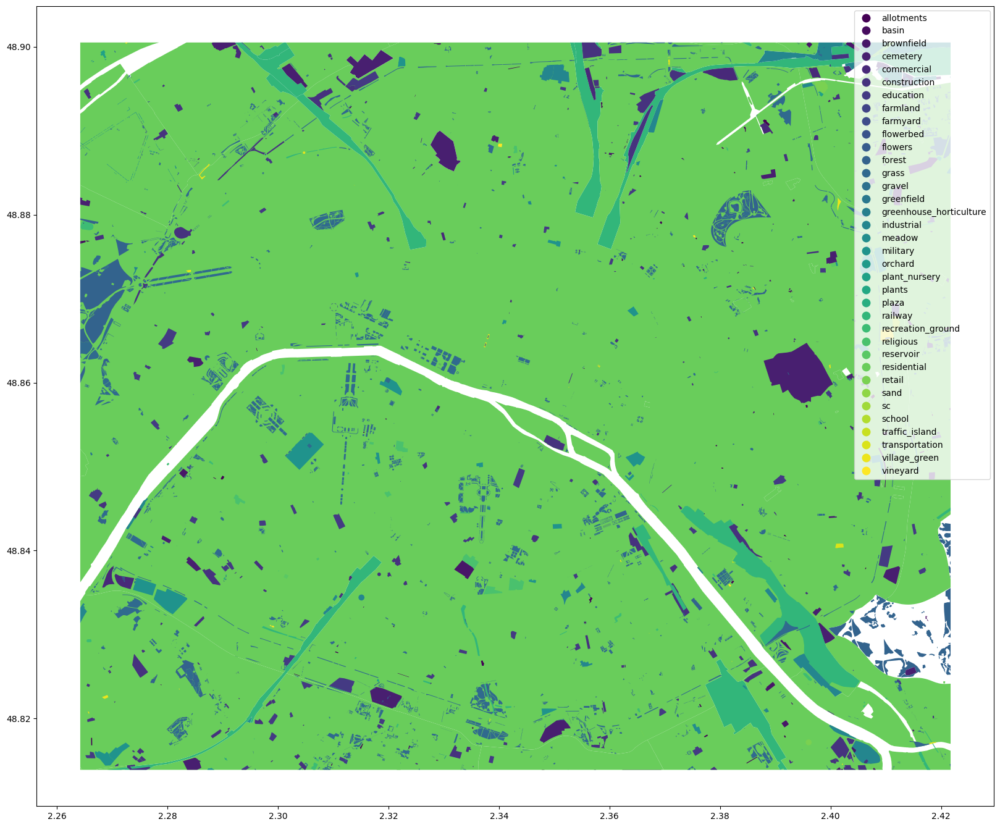

In [7]:
fig, ax = plt.subplots(1,1, figsize= (20,20))
response_df.plot(column = 'landuse',ax = ax, legend= True, cmap='viridis')

In [8]:
response_df.landuse.value_counts()

grass                      3971
flowerbed                   383
forest                      244
construction                232
meadow                      170
residential                  88
education                    74
allotments                   70
industrial                   44
brownfield                   40
basin                        36
railway                      36
cemetery                     33
village_green                33
recreation_ground            28
military                     26
commercial                   17
religious                    12
greenhouse_horticulture       9
vineyard                      8
sand                          7
plant_nursery                 7
reservoir                     5
retail                        5
greenfield                    5
orchard                       5
traffic_island                3
farmyard                      2
plants                        2
flowers                       2
gravel                        2
school  

<AxesSubplot: >

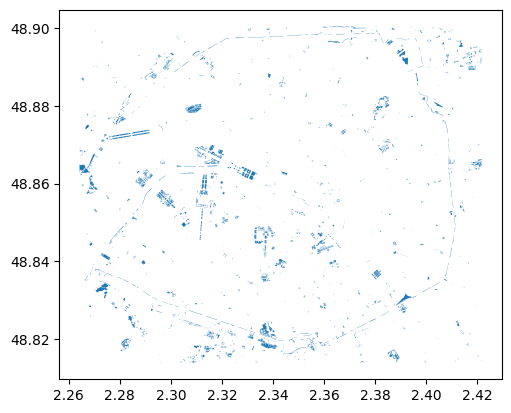

In [9]:
response_df.query('landuse == "grass"').plot()

<AxesSubplot: >

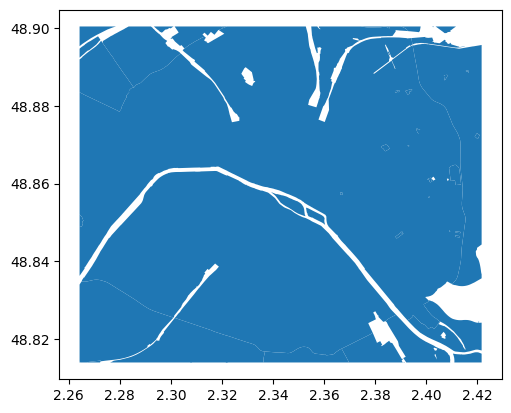

In [10]:
response_df.query('landuse == "residential"').plot()

In [11]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
df_places = gpd.read_file('../raw_data/plu-dans-le-geoportail-de-lurbanisme-zonage.geojson')

2022-12-07 11:41:08,366  collection  WARNING:  Skipping field geo_point_2d: invalid type 3


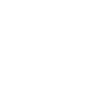

In [13]:
df_places['geometry'][0]

In [14]:
df_places.head()

,libelong,nomfic,libelle,typezone,idurba,geometry
0,Zone urbaine verte,75056_reglement_20220218.pdf,UV,U,75056_PLU_20220218,"POLYGON ((2.28973 48.84465, 2.28994 48.84457, ..."
1,Zone urbaine verte,75056_reglement_20220218.pdf,UV,U,75056_PLU_20220218,"POLYGON ((2.30558 48.84239, 2.30561 48.84234, ..."
2,Zone naturelle et forestière,75056_reglement_20220218.pdf,N,N,75056_PLU_20220218,"POLYGON ((2.27840 48.87777, 2.27853 48.87776, ..."
3,Zone urbaine verte,75056_reglement_20220218.pdf,UV,U,75056_PLU_20220218,"POLYGON ((2.25828 48.83602, 2.25829 48.83601, ..."
4,Zone urbaine verte,75056_reglement_20220218.pdf,UV,U,75056_PLU_20220218,"POLYGON ((2.33595 48.82569, 2.33586 48.82567, ..."


<AxesSubplot: >

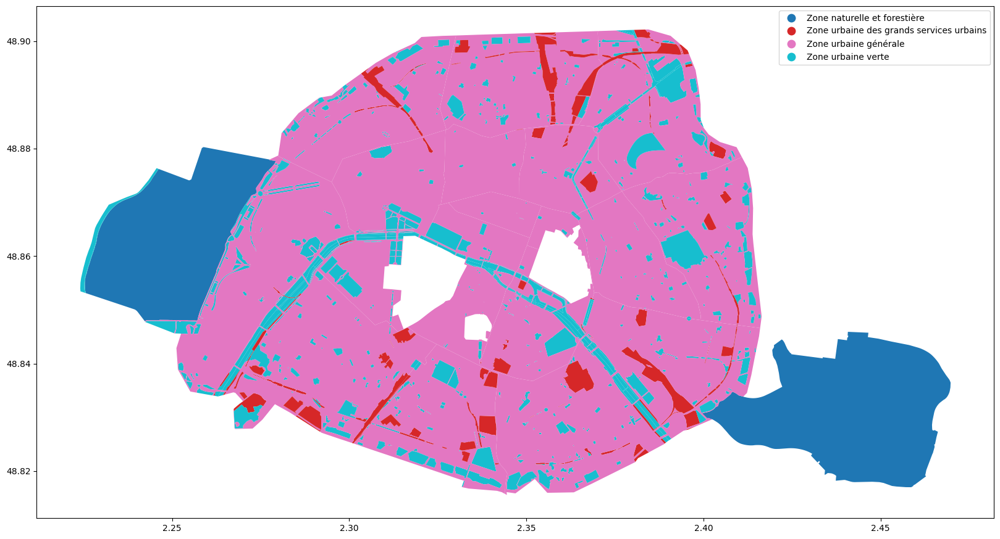

In [15]:
df_places.plot(column = 'libelong', legend = True, figsize = (20,20))

In [16]:
paris = gpd.read_file("../raw_data/PLU_ZONAGE.geojson")

In [17]:
paris.head()

,OBJECTID,c_zonage,c_zonage_brut,c_coinsee,l_co,d_app_plu,d_rev_plu,Shape_Length,Shape_Area,d_etat_lieux,geometry
0,116260,3,UEL1,92063,Rueil-Malmaison,2011-10-21T00:00:00+00:00,2019-06-25T00:00:00+00:00,190.138408,1790.746846,2011-10-21T00:00:00+00:00,"POLYGON ((2.17655 48.88660, 2.17664 48.88667, ..."
1,116261,5,UF,92046,Malakoff,2015-12-16T00:00:00+00:00,2019-11-21T00:00:00+00:00,730.014425,13519.202675,2015-12-16T00:00:00+00:00,"POLYGON ((2.29638 48.81655, 2.29663 48.81670, ..."
2,116262,3,UM,94080,Vincennes,2007-05-30T00:00:00+00:00,2019-10-01T00:00:00+00:00,96.071430,534.197866,2007-05-30T00:00:00+00:00,"POLYGON ((2.43997 48.85262, 2.43973 48.85264, ..."
3,116263,7,U6,94068,Saint-Maur-des-Fossés,2016-11-28T00:00:00+00:00,2021-06-29T00:00:00+00:00,729.153446,30753.935854,2016-11-28T00:00:00+00:00,"POLYGON ((2.48415 48.81079, 2.48407 48.81067, ..."
4,116264,6,UB,93064,Rosny-sous-Bois,2015-11-19T00:00:00+00:00,2019-04-16T00:00:00+00:00,1014.674374,22111.953704,2015-11-19T00:00:00+00:00,"POLYGON ((2.47546 48.87302, 2.47513 48.87311, ..."


<AxesSubplot: >

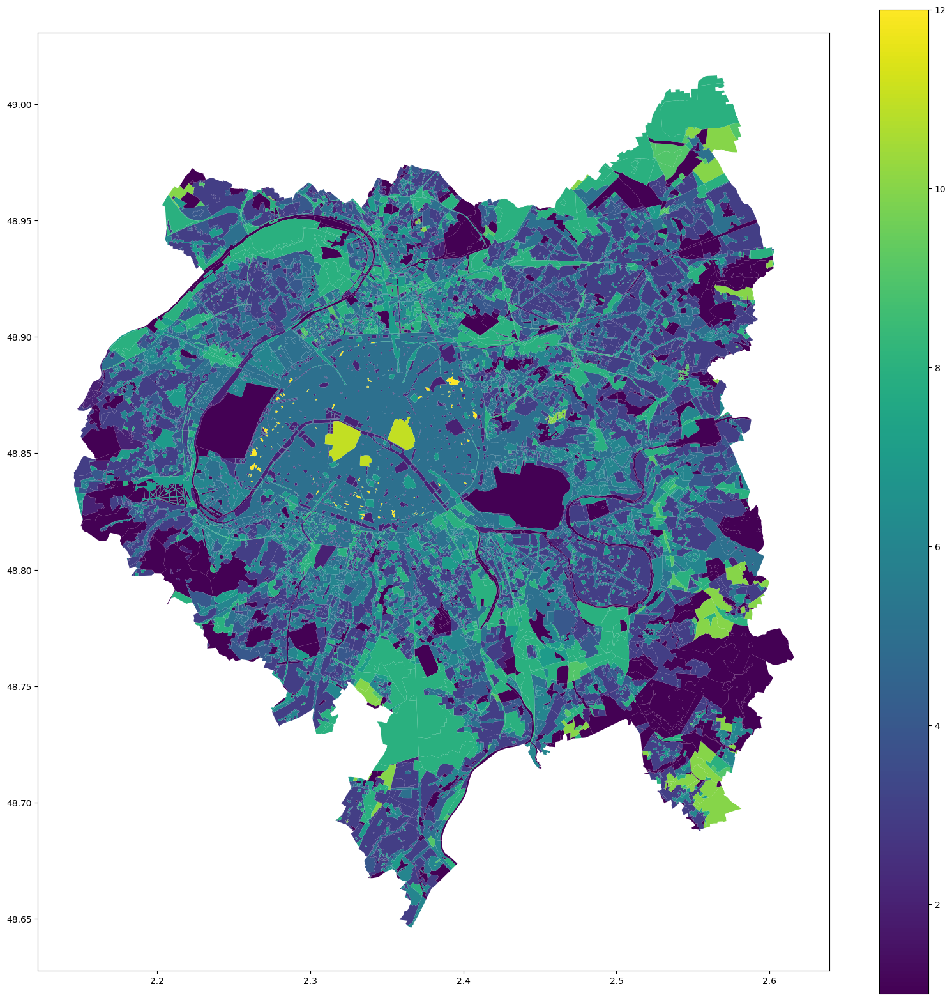

In [18]:
paris.plot(column = 'c_zonage', legend = True, figsize = (20,20))

In [19]:
paris.c_zonage.value_counts()

3     1647
6     1415
5     1339
2     1257
1      988
7      982
8      972
4      694
12     104
10      84
9       81
11       3
Name: c_zonage, dtype: int64

In [20]:
categories = {
    1: 'Natural Open Zone', 
    2: 'Urban Green Zone', 
    3: 'Residential Zone', 
    4: 'Large Housing Developments', 
    5: 'Dense Mixed Zone', 
    6: 'Semi-Dense Mixed Zone', 
    7: 'Public Infrastructure', 
    8: 'Economic Activity Zone', 
    9: 'Brownfield Areas',
    10: 'Agricultural Zone', 
    11: 'Protected Zones', 
    12: 'Brownfield Areas'}

#https://geocatalogue.apur.org/catalogue/srv/fre/catalog.search;jsessionid=node01qysrssf120gg528bwak6lnvb38640.node0#/metadata/urn:apur:plu_zonage_od

In [21]:
paris.head()

,OBJECTID,c_zonage,c_zonage_brut,c_coinsee,l_co,d_app_plu,d_rev_plu,Shape_Length,Shape_Area,d_etat_lieux,geometry
0,116260,3,UEL1,92063,Rueil-Malmaison,2011-10-21T00:00:00+00:00,2019-06-25T00:00:00+00:00,190.138408,1790.746846,2011-10-21T00:00:00+00:00,"POLYGON ((2.17655 48.88660, 2.17664 48.88667, ..."
1,116261,5,UF,92046,Malakoff,2015-12-16T00:00:00+00:00,2019-11-21T00:00:00+00:00,730.014425,13519.202675,2015-12-16T00:00:00+00:00,"POLYGON ((2.29638 48.81655, 2.29663 48.81670, ..."
2,116262,3,UM,94080,Vincennes,2007-05-30T00:00:00+00:00,2019-10-01T00:00:00+00:00,96.071430,534.197866,2007-05-30T00:00:00+00:00,"POLYGON ((2.43997 48.85262, 2.43973 48.85264, ..."
3,116263,7,U6,94068,Saint-Maur-des-Fossés,2016-11-28T00:00:00+00:00,2021-06-29T00:00:00+00:00,729.153446,30753.935854,2016-11-28T00:00:00+00:00,"POLYGON ((2.48415 48.81079, 2.48407 48.81067, ..."
4,116264,6,UB,93064,Rosny-sous-Bois,2015-11-19T00:00:00+00:00,2019-04-16T00:00:00+00:00,1014.674374,22111.953704,2015-11-19T00:00:00+00:00,"POLYGON ((2.47546 48.87302, 2.47513 48.87311, ..."


In [22]:
paris['categories'] = paris['c_zonage'].map(categories)

<AxesSubplot: >

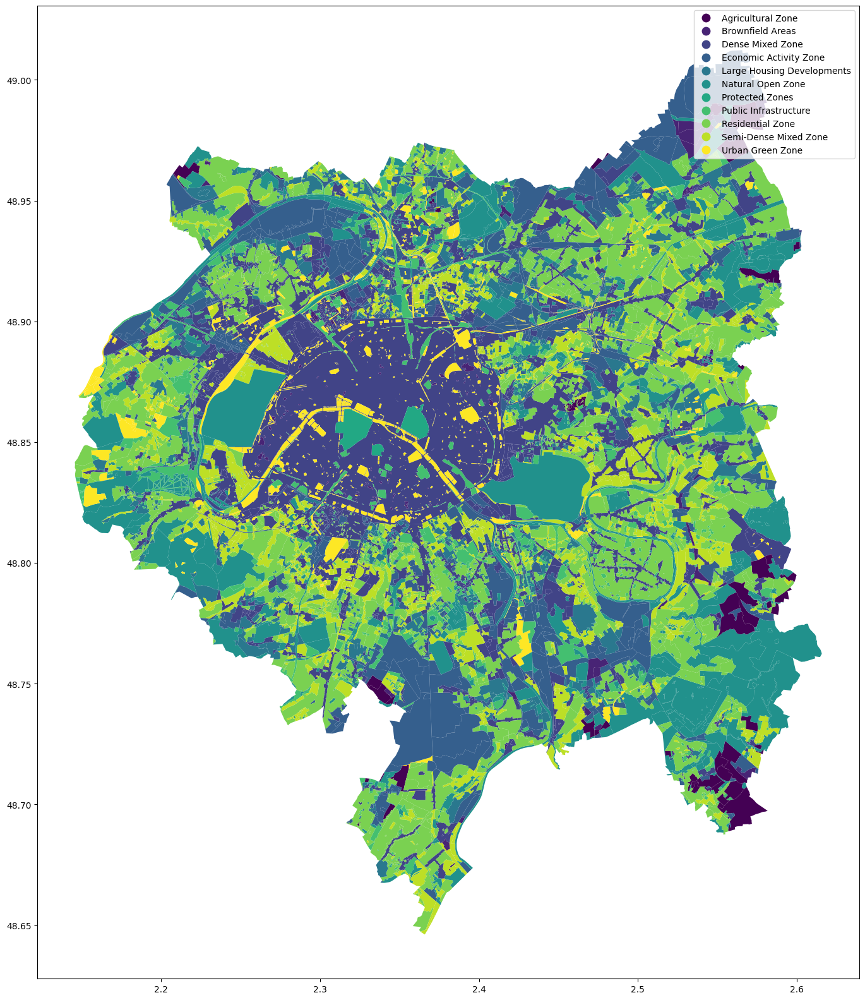

In [23]:
paris.plot(column='categories', legend = True, figsize=(20,20), cmap= 'viridis')

In [24]:
gpd_paris = paris[['OBJECTID', 'c_zonage', 'c_zonage_brut', 'Shape_Length', 'Shape_Area', 'geometry', 'categories']].copy()

<AxesSubplot: >

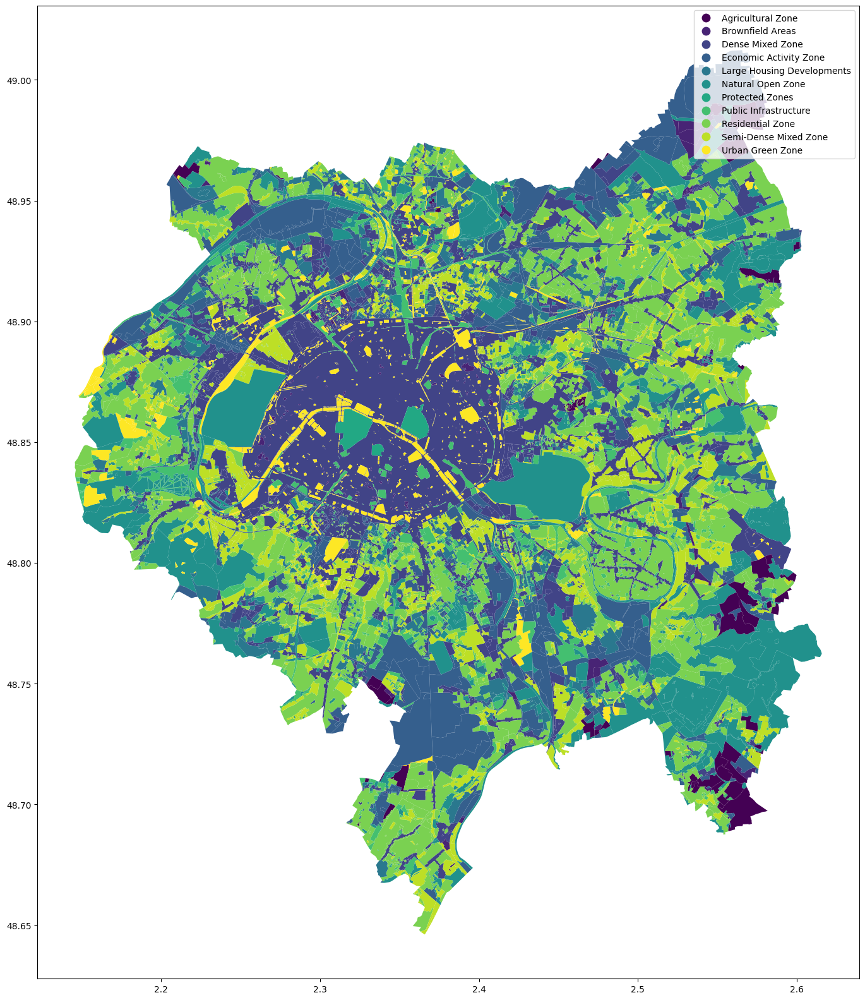

In [25]:
gpd_paris.plot(column = 'categories', legend = True, figsize =(20,20), cmap = 'viridis')

In [27]:
import fiona

In [31]:
gpd_paris.to_file("preprocessed_data/gpd_paris.geojson", driver = "GeoJSON")

/home/leah/.pyenv/versions/3.10.6/envs/future_proofing_cities/lib/python3.10/site-packages/geopandas/io/file.py:299: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


In [4]:
from land_coverage.py import get_data



ModuleNotFoundError: No module named 'land_coverage.py'; 'land_coverage' is not a package

In [32]:
paris.categories.value_counts()

Zone Pavillonnaire       1647
Zone Mixte Semi-Dense    1415
Zone Mixte Dense         1339
Zone Urbaine Verte       1257
Zone Naturelle            988
Equipement                982
Zone d activite           972
Grand Ensemble            694
                          104
Zone Agricole              84
Zone a urbaniser           81
Secteur hors PLu            3
Name: categories, dtype: int64

In [64]:
import requests
import json
import urllib.parse, urllib.request, os, json

In [53]:
URL = 'geocatalogue.apur.org/catalogue'

In [60]:
response = requests.get('https://carto2.apur.org/apur/rest/services/PLU/PLU/MapServer/0/query?outFields=*&where=1%3D1')

In [65]:
response = urllib.request.urlopen('https://carto2.apur.org/apur/rest/services/PLU/PLU/MapServer/0/query?outFields=*&where=1%3D1')
json = response.read()

In [66]:
json

b'\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n<html lang="en">\r\n\r\n<head>\r\n<title>Query: Zonage (ID: 0)</title>\r\n<link href="/apur/rest/static/main.css" rel="stylesheet" type="text/css"/>\r\n</head>\r\n\r\n<body>\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n\r\n<table width="100%" class="userTable">\r\n <tr>\r\n <td class="titlecell">\r\n ArcGIS REST Services Directory\r\n </td>\r\n <td align="right">\r\n   \r\n      \r\n        <a href="https://carto2.apur.org/apur/rest/login">Login</a>\r\n       \r\n            | <a href="https://carto2.apur.org/apur/tokens/">Get Token</a>\r\n                  \r\n      \r\n   \r\n </td>\r\n </tr>\r\n</table>\r\n<table width="100%" class="navTable">\r\n<tr valign="top">\r\n<td class="breadcrumbs">\r\n<a href="/apur/rest/services">Home</a>\r\n\r\n\r\n\r\n\r\n\r\n\r\n  &gt; <a href="/apur/rest/services">services</a>\r\n  \r\n  &gt; <a href="/apur/rest/services/PLU">PLU</a>\r\n  \r\n  &gt; <a href="/apur/rest/services/PLU/PLU/MapServer"

In [70]:
url = "https://carto2.apur.org/apur/rest/services/PLU/PLU/MapServer/0/query?where=1%3D1&outFields=*&outSR=4326&f=json"
response = requests.get(url)
response

<Response [200]>

In [71]:
response.json()

{'displayFieldName': 'c_zonage_brut',
 'fieldAliases': {'OBJECTID': 'objectid',
  'c_zonage': 'Zonage',
  'c_zonage_brut': 'Zonage brut (Commune)',
  'c_coinsee': 'Code INSEE Commune',
  'l_co': 'Nom Commune',
  'd_app_plu': 'Date d’approbation du document PLU',
  'd_rev_plu': 'Date de révision/modification du document PLU',
  'Shape_Length': 'Shape_Length',
  'Shape_Area': 'Shape_Area',
  'd_etat_lieux': "Date correspondant à l'état d'avancement"},
 'geometryType': 'esriGeometryPolygon',
 'spatialReference': {'wkid': 4326, 'latestWkid': 4326},
 'fields': [{'name': 'OBJECTID',
   'type': 'esriFieldTypeOID',
   'alias': 'objectid'},
  {'name': 'c_zonage', 'type': 'esriFieldTypeSmallInteger', 'alias': 'Zonage'},
  {'name': 'c_zonage_brut',
   'type': 'esriFieldTypeString',
   'alias': 'Zonage brut (Commune)',
   'length': 50},
  {'name': 'c_coinsee',
   'type': 'esriFieldTypeInteger',
   'alias': 'Code INSEE Commune'},
  {'name': 'l_co',
   'type': 'esriFieldTypeString',
   'alias': 'Nom

In [72]:

gdf = gpd.read_file(requests.get(url).text)

In [74]:
len(paris), len(gdf)

(9566, 3000)

<AxesSubplot: >

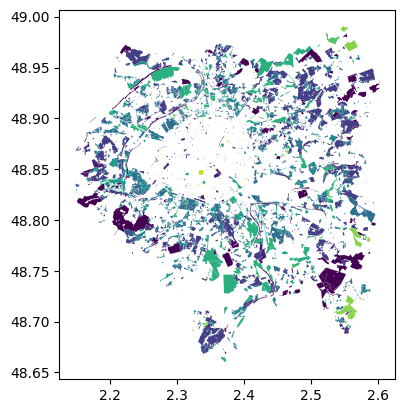

In [75]:
gdf.plot(column='c_zonage')